# Capstone Project 2: Semiconductor Manufacturing Process

## Domain: Semiconductor Manufacturing Process
### Context:
A complex modern semiconductor manufacturing process is monitored through signals collected from sensors or process measurement points. However, not all of these signals are equally valuable in specific monitoring systems. The signals contain a mix of useful information, irrelevant data, and noise. Engineers typically have more signals than necessary. Feature selection can identify the most relevant signals, allowing Process Engineers to determine key factors contributing to yield excursions downstream. This can improve throughput, decrease learning time, and reduce per-unit production costs. By analyzing and testing various combinations of features, the most impactful signals on yield can be identified.
### Data Description:
- **Dataset**: `signal-data.csv` (1567, 592)
- **Details**:
  - The dataset consists of 1567 examples, each with 591 features.
  - Each example represents a single production entity with associated measured features.
  - The labels represent a simple pass/fail yield for in-house line testing:
    - `-1` corresponds to "pass"
    - `1` corresponds to "fail"
  - The dataset includes timestamps for each test point.

### Project Objective:
- Build a classifier to predict the Pass/Fail yield of a particular process entity.
- Analyze whether all features are required to build the model.

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [ ]:
from google.colab import files
up=files.upload()

Saving signal-data.csv to signal-data (1).csv


In [ ]:
data=pd.read_csv("signal-data.csv")

###1.Import and Explore the Data

In [ ]:
data=pd.read_csv('/content/signal-data.csv')

### 2. Data Cleansing

In [ ]:
# Check for the percentage of missing values in each column
missing_percentage = (data.isnull().sum() / len(data)) * 100

# Identify columns with high missing values (e.g., >50% missing)
high_missing_cols = missing_percentage[missing_percentage > 50].index.tolist()

# Summarize columns with high missing values
high_missing_summary = {
    "total_high_missing_cols": len(high_missing_cols),
    "high_missing_cols": high_missing_cols
}

# Display the top 10 columns with the highest missing values percentage
top_missing_cols = missing_percentage.sort_values(ascending=False).head(10)

high_missing_summary, top_missing_cols


({'total_high_missing_cols': 28,
  'high_missing_cols': ['72',
   '73',
   '85',
   '109',
   '110',
   '111',
   '157',
   '158',
   '220',
   '244',
   '245',
   '246',
   '292',
   '293',
   '345',
   '346',
   '358',
   '382',
   '383',
   '384',
   '492',
   '516',
   '517',
   '518',
   '578',
   '579',
   '580',
   '581']},
 158    91.193363
 292    91.193363
 293    91.193363
 157    91.193363
 85     85.577537
 492    85.577537
 220    85.577537
 358    85.577537
 517    64.964901
 245    64.964901
 dtype: float64)

In [ ]:
# Drop columns with >50% missing values
data_cleaned = data.drop(columns=high_missing_cols)

# Confirm the new shape of the dataset
print(f"New dataset shape after dropping columns: {data_cleaned.shape}")



New dataset shape after dropping columns: (1567, 564)


In [ ]:
# Impute numerical columns with the mean
numerical_cols = data_cleaned.select_dtypes(include=['float64', 'int64']).columns
data_cleaned[numerical_cols] = data_cleaned[numerical_cols].fillna(data_cleaned[numerical_cols].mean())

# Impute categorical columns (if any) with the mode
categorical_cols = data_cleaned.select_dtypes(include=['object']).columns
data_cleaned[categorical_cols] = data_cleaned[categorical_cols].fillna(data_cleaned[categorical_cols].mode().iloc[0])



In [ ]:
# Check for any remaining missing values
print(f"Remaining missing values: {data_cleaned.isnull().sum().sum()}")


Remaining missing values: 0


# 2.Data Pre-processing

In [ ]:
# Explore the target variable 'Pass/Fail'
target_balance = data_cleaned['Pass/Fail'].value_counts(normalize=True) * 100

# Display the distribution of the target variable
target_distribution = data_cleaned['Pass/Fail'].value_counts()

target_balance, target_distribution


(Pass/Fail
 -1    93.363114
  1     6.636886
 Name: proportion, dtype: float64,
 Pass/Fail
 -1    1463
  1     104
 Name: count, dtype: int64)

In [ ]:
!pip install imbalanced-learn

In [ ]:
from imblearn.over_sampling import SMOTE

# Separate predictors and target
X = data_cleaned.drop(columns=['Pass/Fail', 'Time'], errors='ignore')
y = data_cleaned['Pass/Fail']

# Apply SMOTE for balancing the target variable
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X, y)

# Check the new target distribution after balancing
balanced_target_distribution = y_resampled.value_counts()

X_resampled.shape, balanced_target_distribution


((2926, 562),
 Pass/Fail
 -1    1463
  1    1463
 Name: count, dtype: int64)

In [ ]:
# Separate predictors (X) and target (y)
X = data_cleaned.drop(columns=['Pass/Fail', 'Time'], errors='ignore')  # Remove target and non-relevant columns
y = data_cleaned['Pass/Fail']

# Confirm the shapes of X and y
print(f"Predictors shape: {X.shape}")
print(f"Target shape: {y.shape}")


Predictors shape: (1567, 562)
Target shape: (1567,)


In [ ]:
from sklearn.model_selection import train_test_split

# Perform train-test split on the balanced data
X_train, X_test, y_train, y_test = train_test_split(
    X_resampled, y_resampled, test_size=0.2, random_state=42, stratify=y_resampled
)

# Confirm the shapes of the train and test sets
print(f"X_train shape: {X_train.shape}")
print(f"X_test shape: {X_test.shape}")
print(f"y_train shape: {y_train.shape}")
print(f"y_test shape: {y_test.shape}")


X_train shape: (2340, 562)
X_test shape: (586, 562)
y_train shape: (2340,)
y_test shape: (586,)


In [ ]:
from sklearn.preprocessing import StandardScaler

# Initialize StandardScaler
scaler = StandardScaler()

# Fit on training data and transform it
X_train_scaled = scaler.fit_transform(X_train)

# Use the same scaler to transform the test data
X_test_scaled = scaler.transform(X_test)


Original Dataset Stats:
                  0            1            2            3            4  \
count  2926.000000  2926.000000  2926.000000  2926.000000  2926.000000   
mean   3007.859689  2496.256970  2199.942164  1374.543110     2.847075   
std      71.955701    71.057958    27.125623   375.449052    41.076580   
min    2743.240000  2158.750000  2060.660000     0.000000     0.681500   
25%    2959.860000  2458.885000  2181.667984  1106.427437     1.070000   
50%    2997.888710  2499.150854  2198.221934  1288.085700     1.309204   
75%    3048.412500  2534.371113  2215.179807  1572.469800     1.486900   
max    3356.350000  2846.440000  2315.266700  3715.041700  1114.536600   

            5            6            7            8            9  ...  \
count  2926.0  2926.000000  2926.000000  2926.000000  2926.000000  ...   
mean    100.0   101.152701     0.122026     1.467282    -0.001848  ...   
std       0.0     5.248408     0.006627     0.062884     0.013460  ...   
min     100.

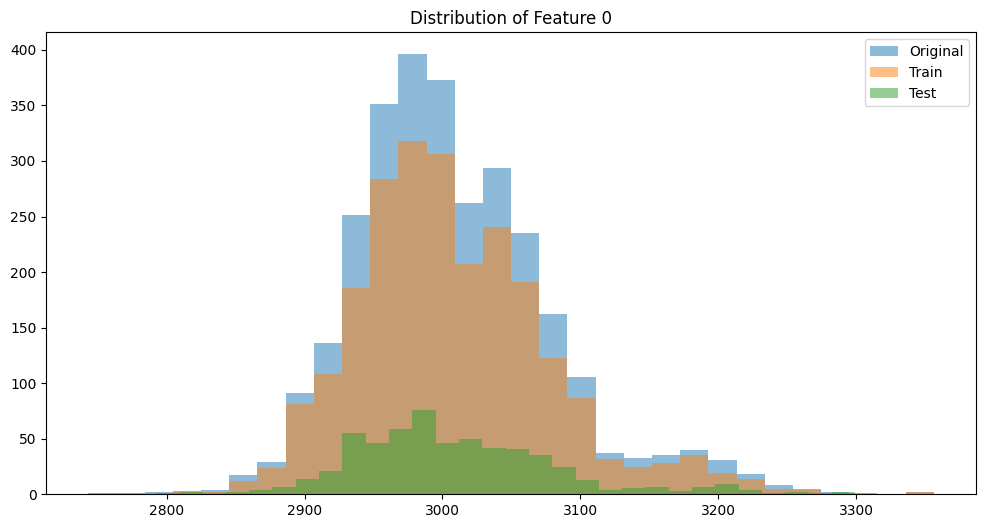

In [ ]:
# Compare descriptive statistics
original_stats = X_resampled.describe()
train_stats = X_train.describe()
test_stats = X_test.describe()

# Display a summary comparison
print("Original Dataset Stats:\n", original_stats)
print("\nTraining Dataset Stats:\n", train_stats)
print("\nTesting Dataset Stats:\n", test_stats)

# Compare distributions visually
import matplotlib.pyplot as plt

feature_to_compare = '0'  # Replace with any feature name or index
plt.figure(figsize=(12, 6))
plt.hist(X_resampled[feature_to_compare], bins=30, alpha=0.5, label='Original')
plt.hist(X_train[feature_to_compare], bins=30, alpha=0.5, label='Train')
plt.hist(X_test[feature_to_compare], bins=30, alpha=0.5, label='Test')
plt.legend()
plt.title(f"Distribution of Feature {feature_to_compare}")
plt.show()


# 3. Data analysis & visualisation:






In [ ]:
import pandas as pd
import numpy as np
import warnings
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# Disabling warnings
warnings.filterwarnings('ignore')

# Load the dataset
file_path = '/content/signal-data.csv'  # Update with the correct file path
data = pd.read_csv(file_path)

# Step 1: Check for the percentage of missing values in each column
missing_percentage = (data.isnull().sum() / len(data)) * 100

# Identify columns with high missing values (e.g., >50% missing)
high_missing_cols = missing_percentage[missing_percentage > 50].index.tolist()

# Drop columns with >50% missing values
data_cleaned = data.drop(columns=high_missing_cols)

# Step 2: Impute numerical columns with the mean
numerical_cols = data_cleaned.select_dtypes(include=['float64', 'int64']).columns
data_cleaned[numerical_cols] = data_cleaned[numerical_cols].fillna(data_cleaned[numerical_cols].mean())

# Impute categorical columns (if any) with the mode
categorical_cols = data_cleaned.select_dtypes(include=['object']).columns
data_cleaned[categorical_cols] = data_cleaned[categorical_cols].fillna(data_cleaned[categorical_cols].mode().iloc[0])

# Save the cleaned data to a CSV file
cleaned_data_file = '/content/signal_data_cleaned.csv'
data_cleaned.to_csv(cleaned_data_file, index=False)

# Step 3: Explore the target variable 'Pass/Fail'
target_balance = data_cleaned['Pass/Fail'].value_counts(normalize=True) * 100
target_distribution = data_cleaned['Pass/Fail'].value_counts()

# Step 4: Apply SMOTE for balancing the target variable
X = data_cleaned.drop(columns=['Pass/Fail', 'Time'], errors='ignore')  # Predictors
y = data_cleaned['Pass/Fail']  # Target

smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X, y)

# Step 5: Perform train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X_resampled, y_resampled, test_size=0.2, random_state=42, stratify=y_resampled
)

# Step 6: Scale the data using StandardScaler
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Save cleaned data
print(f"Cleaned dataset saved to: {cleaned_data_file}")


Cleaned dataset saved to: /content/signal_data_cleaned.csv


In [ ]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Load the cleaned dataset
data_cleaned = pd.read_csv('/content/signal_data_cleaned.csv')  # Update the path if needed

In [ ]:
# Display the first few rows of the dataset
print("Preview of the cleaned dataset:")
print(data_cleaned.head())


Preview of the cleaned dataset:
                  Time        0        1          2          3       4      5  \
0  2008-07-19 11:55:00  3030.93  2564.00  2187.7333  1411.1265  1.3602  100.0   
1  2008-07-19 12:32:00  3095.78  2465.14  2230.4222  1463.6606  0.8294  100.0   
2  2008-07-19 13:17:00  2932.61  2559.94  2186.4111  1698.0172  1.5102  100.0   
3  2008-07-19 14:43:00  2988.72  2479.90  2199.0333   909.7926  1.3204  100.0   
4  2008-07-19 15:22:00  3032.24  2502.87  2233.3667  1326.5200  1.5334  100.0   

          6       7       8  ...      577     582     583     584      585  \
0   97.6133  0.1242  1.5005  ...  14.9509  0.5005  0.0118  0.0035   2.3630   
1  102.3433  0.1247  1.4966  ...  10.9003  0.5019  0.0223  0.0055   4.4447   
2   95.4878  0.1241  1.4436  ...   9.2721  0.4958  0.0157  0.0039   3.1745   
3  104.2367  0.1217  1.4882  ...   8.5831  0.4990  0.0103  0.0025   2.0544   
4  100.3967  0.1235  1.5031  ...  10.9698  0.4800  0.4766  0.1045  99.3032   

        586 

In [ ]:
# Step 3.1: Perform detailed relevant statistical analysis
print("\nStatistical Summary:")
print(data_cleaned.describe(include='all'))  # Include all columns, even categorical ones

print("\nData Types and Missing Values:")
print(data_cleaned.info())
print("\nMissing values count per column:")
print(data_cleaned.isnull().sum())


Statistical Summary:
                       Time            0            1            2  \
count                  1567  1567.000000  1567.000000  1567.000000   
unique                 1534          NaN          NaN          NaN   
top     2008-10-15 01:52:00          NaN          NaN          NaN   
freq                      3          NaN          NaN          NaN   
mean                    NaN  3014.452896  2495.850231  2200.547318   
std                     NaN    73.480613    80.227793    29.380932   
min                     NaN  2743.240000  2158.750000  2060.660000   
25%                     NaN  2966.665000  2452.885000  2181.099950   
50%                     NaN  3011.840000  2498.910000  2200.955600   
75%                     NaN  3056.540000  2538.745000  2218.055500   
max                     NaN  3356.350000  2846.440000  2315.266700   

                  3            4       5            6            7  \
count   1567.000000  1567.000000  1567.0  1567.000000  1567.000000 

In [ ]:
# Step 3.2: Univariate Analysis
print("\nUnivariate Analysis:")

# Categorical columns
categorical_columns = data_cleaned.select_dtypes(include=['object']).columns
print("Categorical Columns:", categorical_columns)

# Numerical columns
numerical_columns = data_cleaned.select_dtypes(include=['int64', 'float64']).columns
print("Numerical Columns:", numerical_columns)


Univariate Analysis:
Categorical Columns: Index(['Time'], dtype='object')
Numerical Columns: Index(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9',
       ...
       '577', '582', '583', '584', '585', '586', '587', '588', '589',
       'Pass/Fail'],
      dtype='object', length=563)


<ipython-input-6-69e6753fbdf6>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x="Pass/Fail", data=data_cleaned, palette="coolwarm")


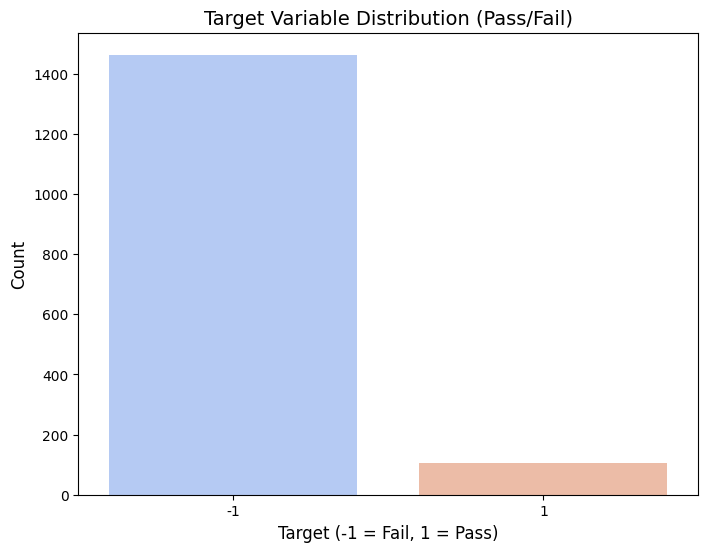

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Target variable distribution
plt.figure(figsize=(8, 6))
sns.countplot(x="Pass/Fail", data=data_cleaned, palette="coolwarm")
plt.title("Target Variable Distribution (Pass/Fail)", fontsize=14)
plt.xlabel("Target (-1 = Fail, 1 = Pass)", fontsize=12)
plt.ylabel("Count", fontsize=12)
plt.show()


Top Features with Missing Values:
Time    0
398     0
392     0
393     0
394     0
395     0
396     0
397     0
399     0
390     0
dtype: int64


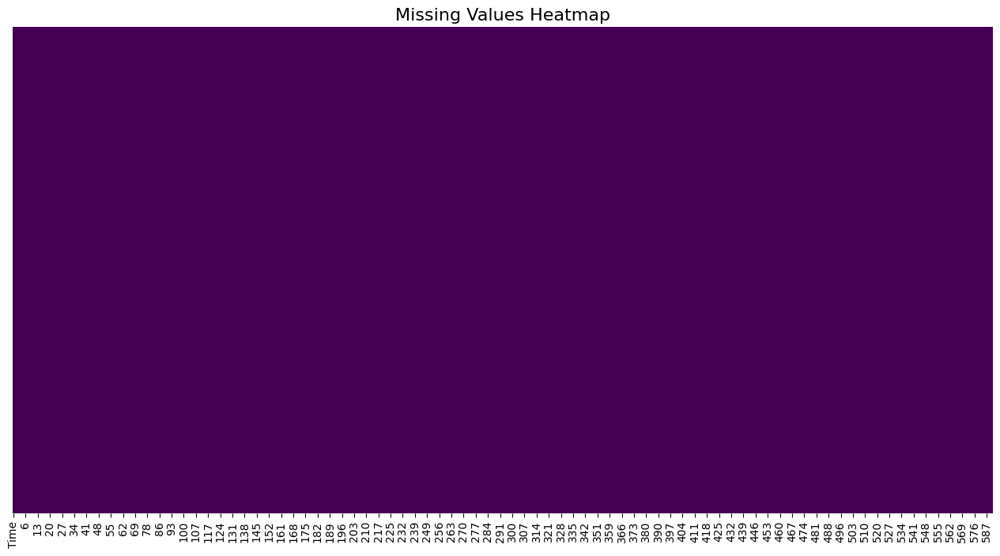

In [ ]:
# Step 1: Import necessary libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Step 2: Load the dataset
file_path = '/content/signal_data_cleaned.csv'  # Update the file path if needed
df = pd.read_csv(file_path)

# Step 3: Checking for missing values
missing_values = df.isnull().sum().sort_values(ascending=False)
print("Top Features with Missing Values:")
print(missing_values.head(10))

# Step 4: Visualizing missing values with a heatmap
plt.figure(figsize=(16, 8))
sns.heatmap(df.isnull(), cbar=False, cmap="viridis", yticklabels=False)
plt.title("Missing Values Heatmap", fontsize=16)
plt.show()


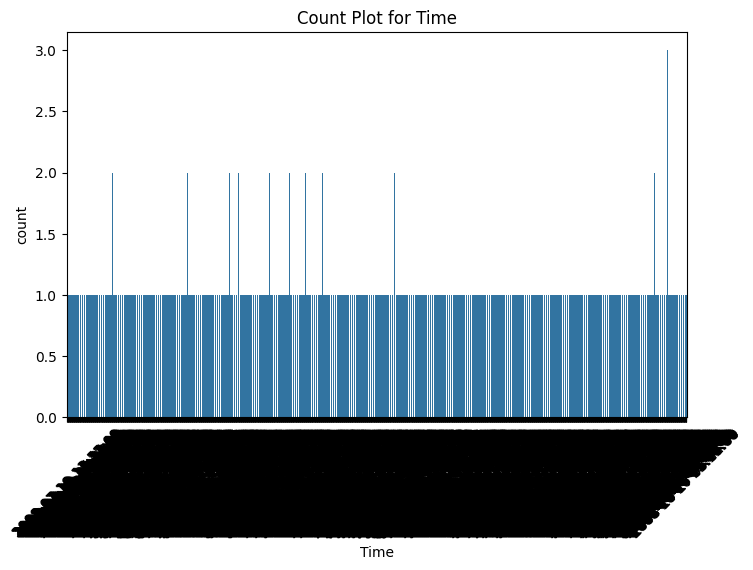

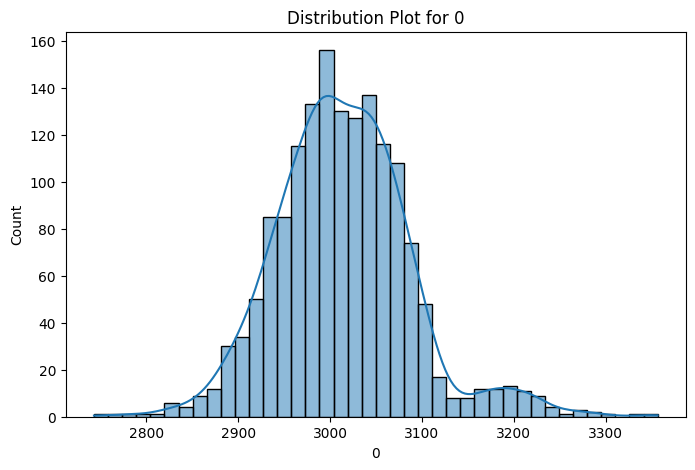

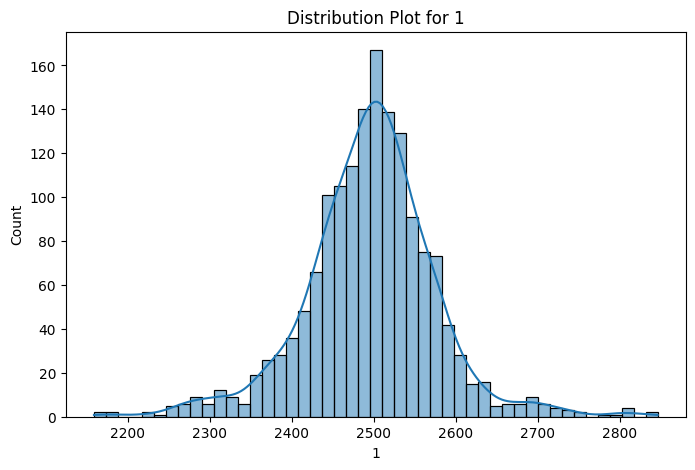

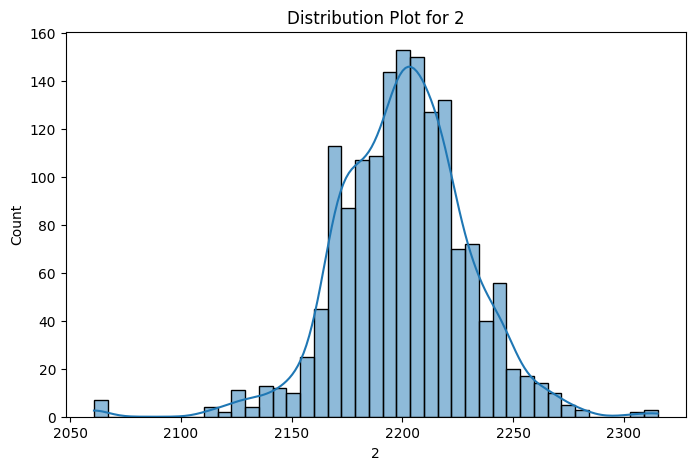

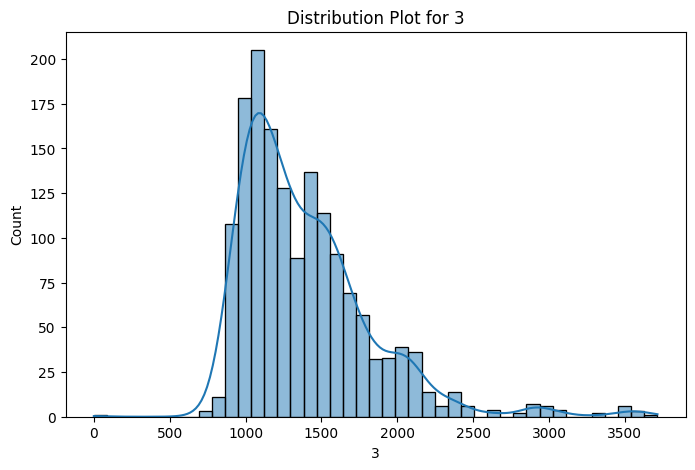

...

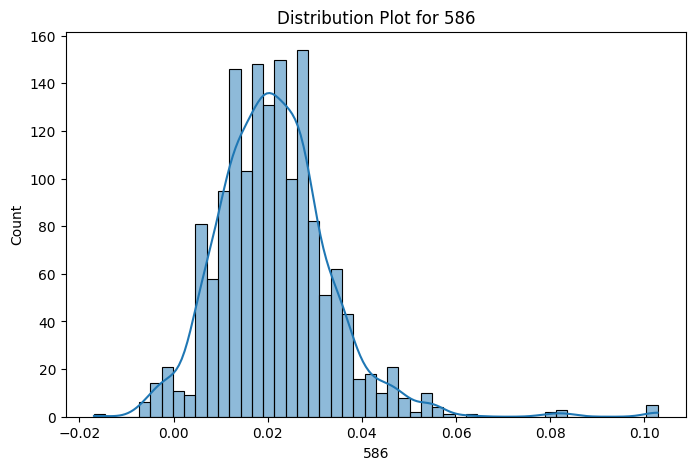

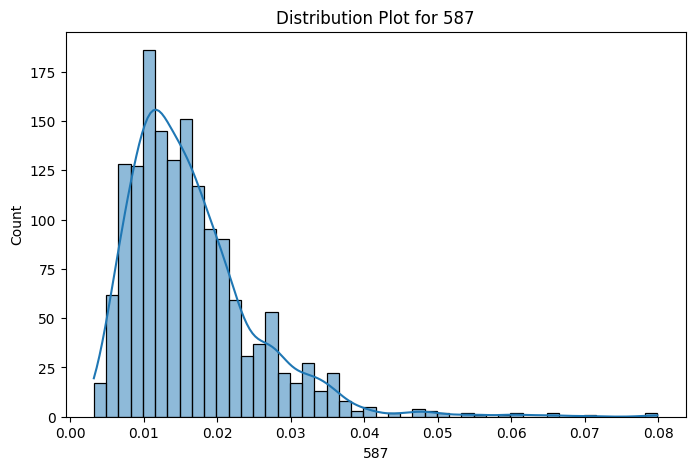

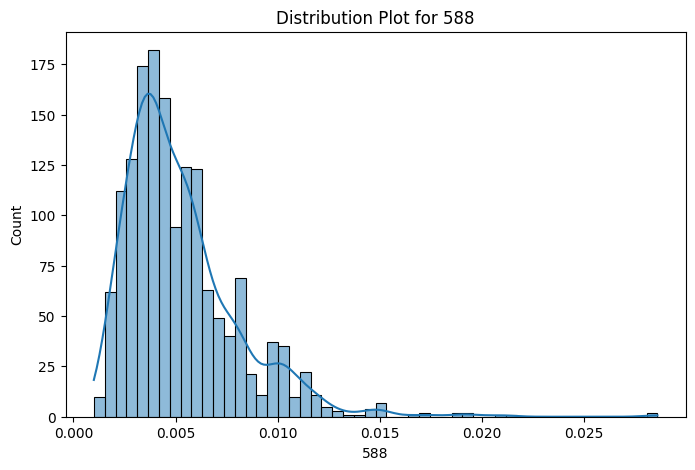

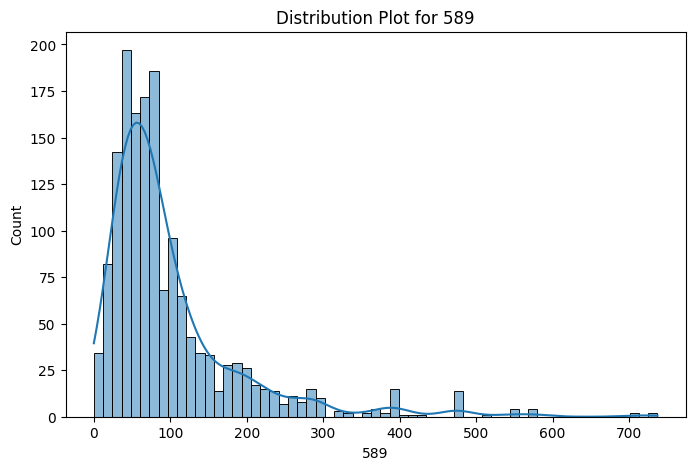

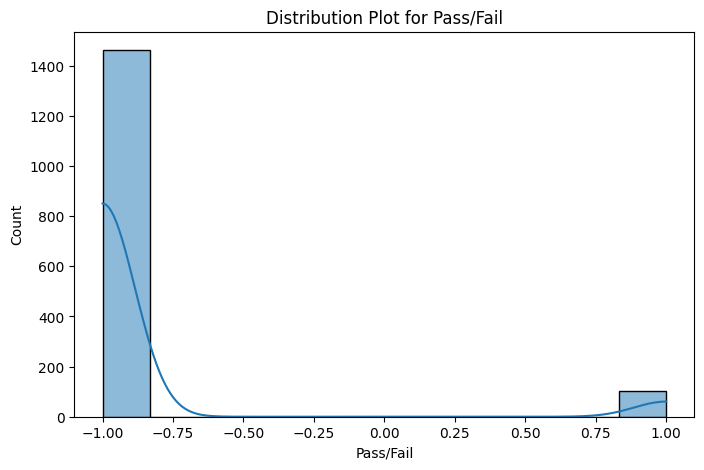

In [ ]:
# Visualize categorical data
for col in categorical_columns:
    plt.figure(figsize=(8, 5))
    sns.countplot(data=data_cleaned, x=col)
    plt.title(f"Count Plot for {col}")
    plt.xticks(rotation=45)
    plt.show()

# Visualize numerical data
for col in numerical_columns:
    plt.figure(figsize=(8, 5))
    sns.histplot(data_cleaned[col], kde=True)
    plt.title(f"Distribution Plot for {col}")
    plt.show()

In [ ]:
print(df.columns)  # View all column names
print(df.info())   # Check data types and non-null counts


Index(['Time', '0', '1', '2', '3', '4', '5', '6', '7', '8',
       ...
       '577', '582', '583', '584', '585', '586', '587', '588', '589',
       'Pass/Fail'],
      dtype='object', length=564)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1567 entries, 0 to 1566
Columns: 564 entries, Time to Pass/Fail
dtypes: float64(562), int64(1), object(1)
memory usage: 6.7+ MB
None



Bivariate Analysis:


<ipython-input-14-1efd19d791ae>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="Pass/Fail", y=first_feature, data=df, palette="coolwarm")


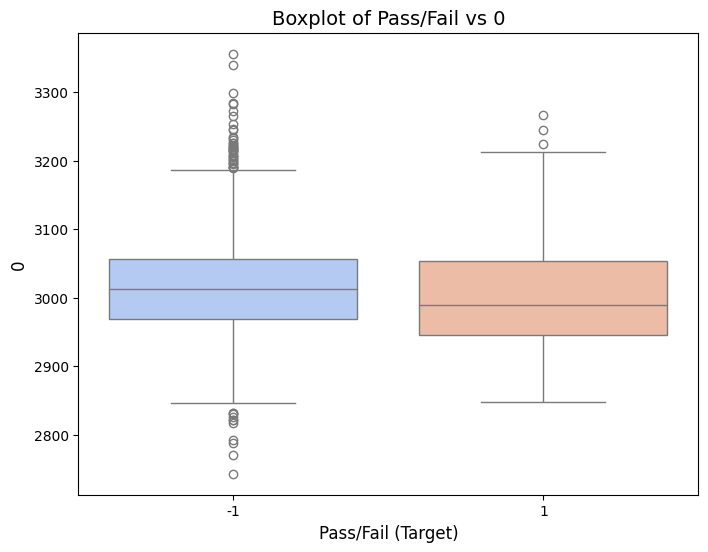

In [ ]:
# Step 6: Bivariate Analysis
print("\nBivariate Analysis:")

# Select the first numeric feature after "Time" (index 1)
first_feature = "0"  # Assuming the column named "0" is the first numeric feature

# Boxplot for Target vs First Numeric Feature
plt.figure(figsize=(8, 6))
sns.boxplot(x="Pass/Fail", y=first_feature, data=df, palette="coolwarm")
plt.title(f"Boxplot of Pass/Fail vs {first_feature}", fontsize=14)
plt.xlabel("Pass/Fail (Target)", fontsize=12)
plt.ylabel(first_feature, fontsize=12)
plt.show()



Bivariate Analysis:


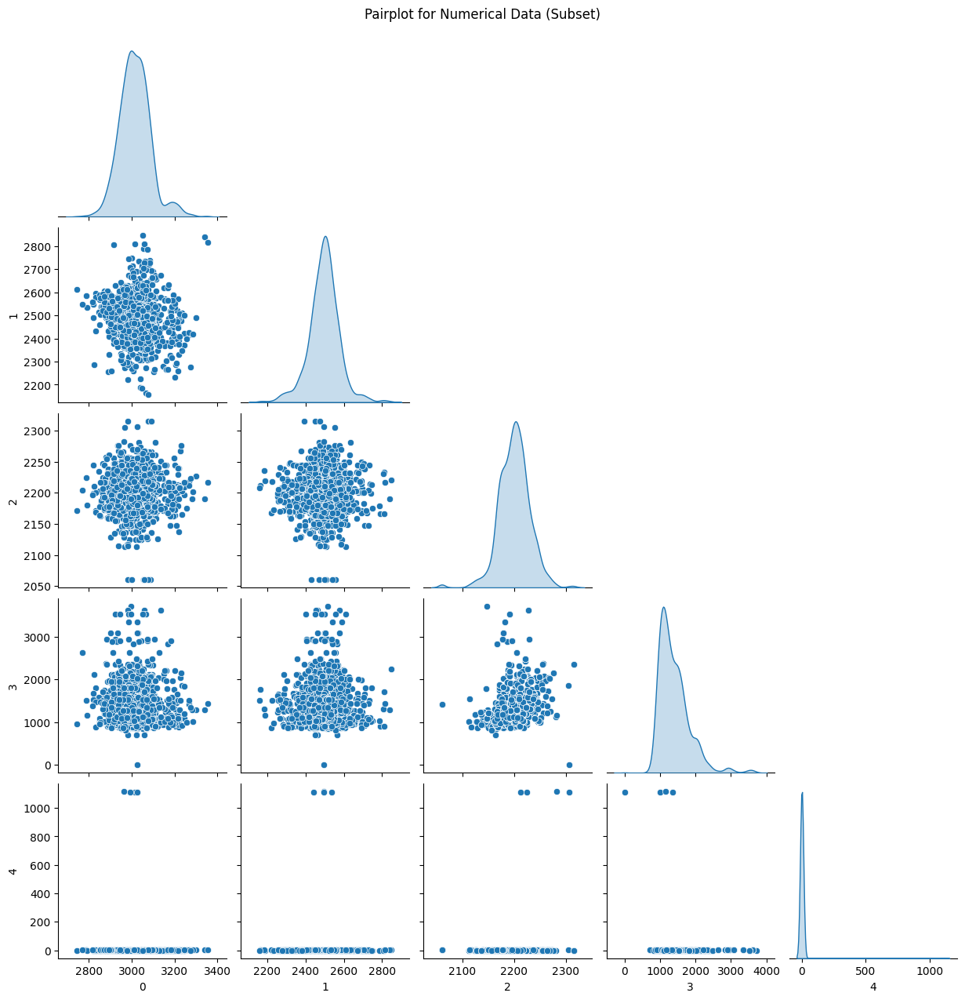

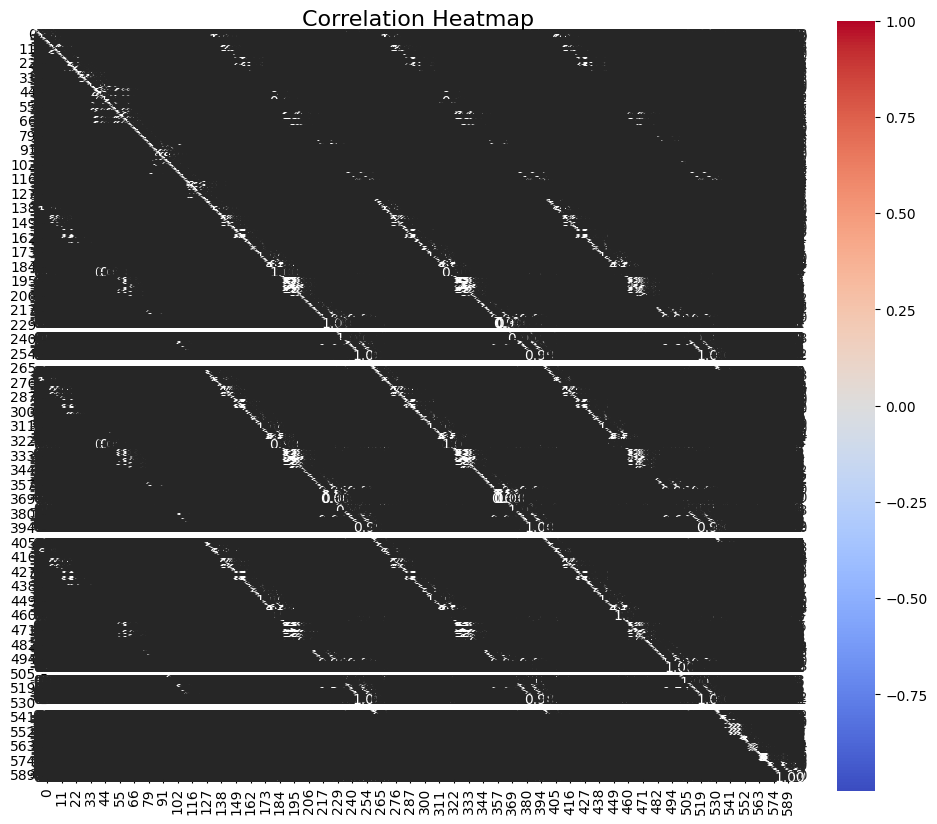

<ipython-input-19-68b8da3c94e7>:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data_cleaned[cat_col], y=data_cleaned[num_col], palette="coolwarm")


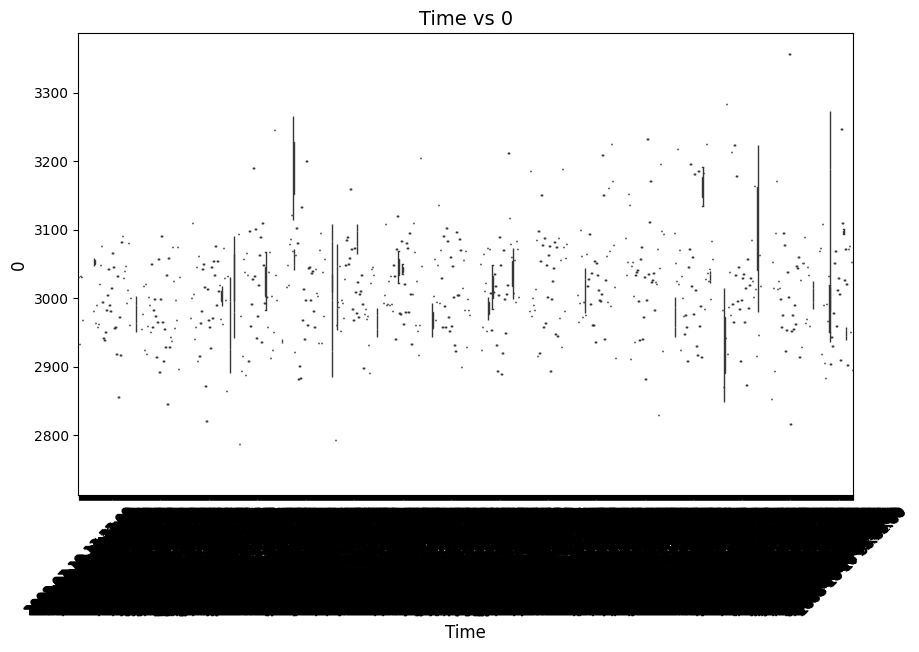

<ipython-input-19-68b8da3c94e7>:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data_cleaned[cat_col], y=data_cleaned[num_col], palette="coolwarm")


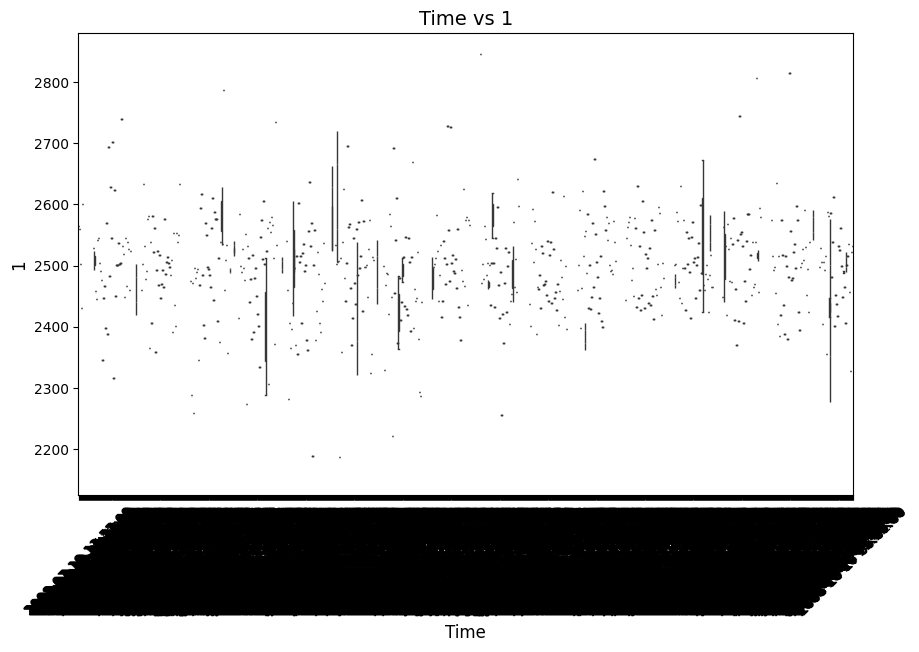

<ipython-input-19-68b8da3c94e7>:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data_cleaned[cat_col], y=data_cleaned[num_col], palette="coolwarm")


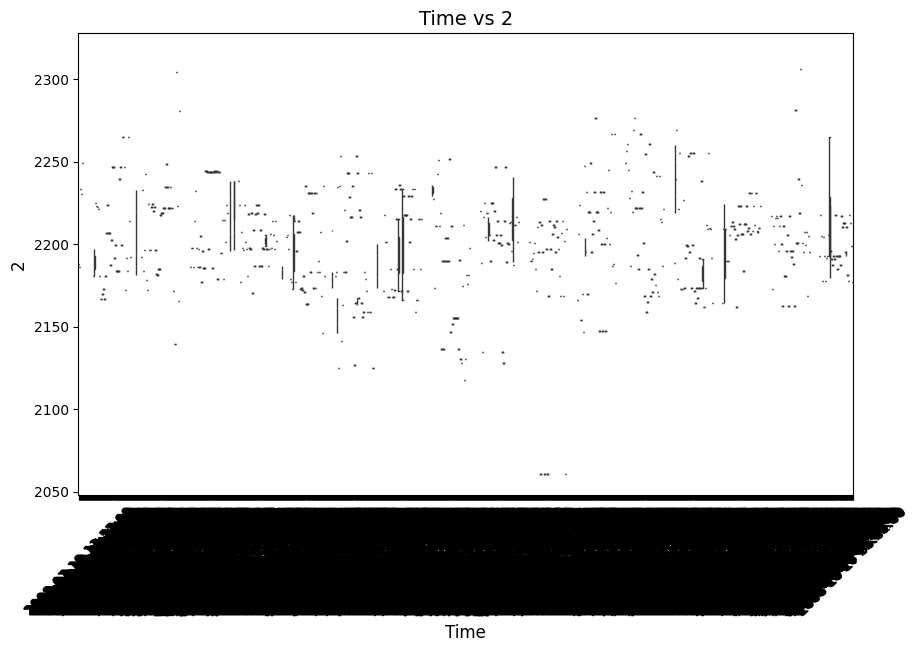

In [ ]:
# Importing required libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Load the cleaned dataset
file_path = '/content/signal_data_cleaned.csv'  # Replace with your dataset path
data_cleaned = pd.read_csv(file_path)

# Separate numerical and categorical columns
numerical_columns = data_cleaned.select_dtypes(include=[np.number]).columns.tolist()
categorical_columns = data_cleaned.select_dtypes(exclude=[np.number]).columns.tolist()

# Limit numerical columns for pairplot to the first 5 for optimization
pairplot_columns = numerical_columns[:5]

print("\nBivariate Analysis:")

# Pairplots for numerical columns (Limited to 5 for better performance)
if len(pairplot_columns) > 1:
    sns.pairplot(data_cleaned[pairplot_columns], diag_kind="kde", corner=True)
    plt.suptitle("Pairplot for Numerical Data (Subset)", y=1.02)
    plt.show()

# Correlation Heatmap for all numerical columns
if len(numerical_columns) > 1:
    plt.figure(figsize=(12, 10))
    sns.heatmap(data_cleaned[numerical_columns].corr(), annot=True, cmap='coolwarm', fmt='.2f', square=True)
    plt.title("Correlation Heatmap", fontsize=16)
    plt.show()

# Categorical vs. Numerical Analysis (Limit to first 3 categorical and numerical columns for optimization)
cat_columns_to_plot = categorical_columns[:3]
num_columns_to_plot = numerical_columns[:3]

for cat_col in cat_columns_to_plot:
    for num_col in num_columns_to_plot:
        plt.figure(figsize=(10, 6))
        sns.boxplot(x=data_cleaned[cat_col], y=data_cleaned[num_col], palette="coolwarm")
        plt.title(f"{cat_col} vs {num_col}", fontsize=14)
        plt.xticks(rotation=45)
        plt.xlabel(cat_col, fontsize=12)
        plt.ylabel(num_col, fontsize=12)
        plt.show()


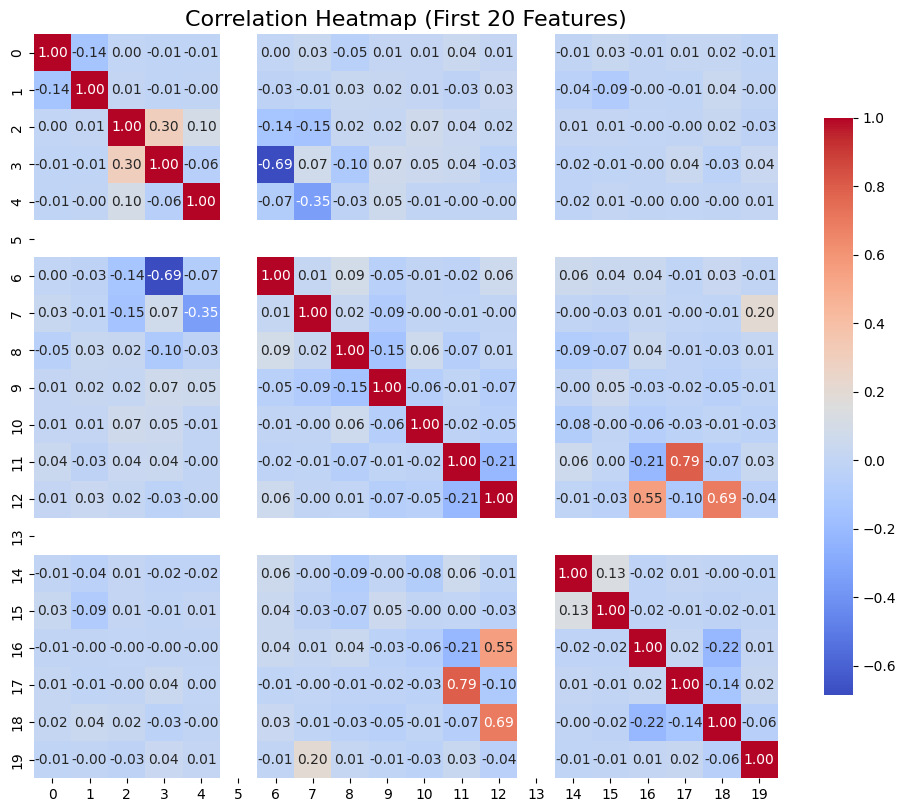

In [ ]:
# step 7. Multivariate Analysis
# Correlation Analysis for a subset of features (first 20 for simplicity)
subset_corr_matrix = df.iloc[:, 1:21].corr()

plt.figure(figsize=(12, 10))
sns.heatmap(
    subset_corr_matrix,
    cmap="coolwarm",
    annot=True,  # Display correlation values
    fmt=".2f",   # Format to 2 decimal places
    square=True,
    cbar_kws={"shrink": 0.75}
)
plt.title("Correlation Heatmap (First 20 Features)", fontsize=16)
plt.show()


In [ ]:
#step 8: Highlighting high correlations
threshold = 0.75  # Set a correlation threshold
high_corr_features = subset_corr_matrix[
    (subset_corr_matrix > threshold) & (subset_corr_matrix < 1.0)
]
print("Highly Correlated Features (Threshold > 0.75):")
print(high_corr_features.dropna(how="all", axis=0).dropna(how="all", axis=1))


Highly Correlated Features (Threshold > 0.75):
          11        17
11       NaN  0.793896
17  0.793896       NaN


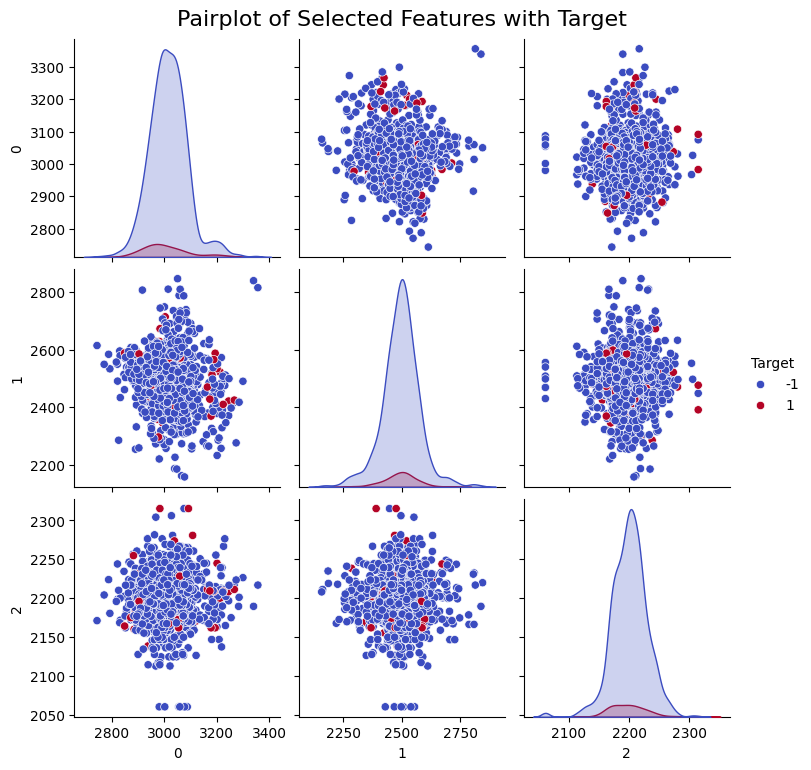

In [ ]:
#step 9: Pairplot for a subset of features and the Target variable

if "Target" not in df.columns:
    df.rename(columns={"Pass/Fail": "Target"}, inplace=True)

# Select a subset of features including the target variable
subset_features = [first_feature, df.columns[2], df.columns[3], "Target"]

# Create a pairplot
sns.pairplot(df[subset_features], hue="Target", diag_kind="kde", palette="coolwarm")
plt.suptitle("Pairplot of Selected Features with Target", y=1.02, fontsize=16)
plt.show()


**DECISION TREE**

In [ ]:
# Decision Tree algo
from sklearn.tree import  DecisionTreeClassifier
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
model = DecisionTreeClassifier()

In [ ]:
parameters = {'criterion':('entropy', 'gini', 'log_loss'), 'max_depth':range(2,10), 'min_samples_split': range(2,8), 'splitter':['best', 'random'], 'max_features': ['sqrt', 'log2']}
gsv = GridSearchCV(estimator = model, param_grid = parameters, cv = KFold(n_splits = 10), verbose = 400)

In [ ]:
gsv.fit(X_train_scaled,y_train)

Streaming output truncated to the last 5000 lines.
[CV 1/10; 327/576] START criterion=gini, max_depth=7, max_features=log2, min_samples_split=3, splitter=best
[CV 1/10; 327/576] END criterion=gini, max_depth=7, max_features=log2, min_samples_split=3, splitter=best;, score=0.748 total time=   0.0s
[CV 2/10; 327/576] START criterion=gini, max_depth=7, max_features=log2, min_samples_split=3, splitter=best
[CV 2/10; 327/576] END criterion=gini, max_depth=7, max_features=log2, min_samples_split=3, splitter=best;, score=0.726 total time=   0.0s
[CV 3/10; 327/576] START criterion=gini, max_depth=7, max_features=log2, min_samples_split=3, splitter=best
[CV 3/10; 327/576] END criterion=gini, max_depth=7, max_features=log2, min_samples_split=3, splitter=best;, score=0.795 total time=   0.0s
[CV 4/10; 327/576] START criterion=gini, max_depth=7, max_features=log2, min_samples_split=3, splitter=best
[CV 4/10; 327/576] END criterion=gini, max_depth=7, max_features=log2, min_samples_split=3, splitter

GridSearchCV(cv=KFold(n_splits=10, random_state=None, shuffle=False),
             estimator=DecisionTreeClassifier(),
             param_grid={'criterion': ('entropy', 'gini', 'log_loss'),
                         'max_depth': range(2, 10),
                         'max_features': ['sqrt', 'log2'],
                         'min_samples_split': range(2, 8),
                         'splitter': ['best', 'random']},
             verbose=400)

In [ ]:
gsv.score(X_train_scaled,y_train)

0.95

In [ ]:
gsv.best_estimator_, gsv.best_score_

(DecisionTreeClassifier(criterion='entropy', max_depth=9, max_features='sqrt'),
 0.8542735042735042)

In [ ]:
model = DecisionTreeClassifier( max_depth=9, max_features='sqrt',
                        min_samples_split=7, splitter='random')

model.fit(X_train_scaled,y_train)
model_train_score = model.score(X_train_scaled,y_train)*100
model_test_score = model.score(X_test_scaled,y_test)*100

print(f'train score is: {model_train_score} and test score is: {model_test_score}')

train score is: 83.76068376068376 and test score is: 80.3754266211604


**RANDOM FOREST**

In [ ]:
from sklearn.ensemble import RandomForestClassifier


model2 = RandomForestClassifier()

from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
parameters = {'criterion': ['gini', 'entropy'], 'n_estimators':[10,100, 150], 'max_depth': range(3,6)}
gsv = GridSearchCV(estimator = model2, param_grid = parameters, cv = KFold(n_splits = 5), verbose = 400)

gsv.fit(X_train_scaled,y_train)
gsv.score(X_train_scaled,y_train)

Fitting 5 folds for each of 18 candidates, totalling 90 fits
[CV 1/5; 1/18] START criterion=gini, max_depth=3, n_estimators=10...............
[CV 1/5; 1/18] END criterion=gini, max_depth=3, n_estimators=10;, score=0.821 total time=   0.1s
[CV 2/5; 1/18] START criterion=gini, max_depth=3, n_estimators=10...............
[CV 2/5; 1/18] END criterion=gini, max_depth=3, n_estimators=10;, score=0.861 total time=   0.2s
[CV 3/5; 1/18] START criterion=gini, max_depth=3, n_estimators=10...............
[CV 3/5; 1/18] END criterion=gini, max_depth=3, n_estimators=10;, score=0.829 total time=   0.1s
[CV 4/5; 1/18] START criterion=gini, max_depth=3, n_estimators=10...............
[CV 4/5; 1/18] END criterion=gini, max_depth=3, n_estimators=10;, score=0.844 total time=   0.1s
[CV 5/5; 1/18] START criterion=gini, max_depth=3, n_estimators=10...............
[CV 5/5; 1/18] END criterion=gini, max_depth=3, n_estimators=10;, score=0.840 total time=   0.2s
[CV 1/5; 2/18] START criterion=gini, max_depth=3,

0.9641025641025641

In [ ]:
gsv.best_estimator_, gsv.best_score_

(RandomForestClassifier(max_depth=5), 0.9316239316239316)

In [ ]:
model2 = RandomForestClassifier(criterion='entropy',max_depth=5, n_estimators=150)
model2.fit(X_train_scaled,y_train)
model2_train_score = model2.score(X_train_scaled,y_train)*100
model2_test_score = model2.score(X_test_scaled,y_test)*100
print(f'train score is: {model2_train_score} and test score is: {model2_test_score}')

train score is: 96.36752136752136 and test score is: 94.02730375426621


**LOGISTIC REGRESSION**

In [ ]:
from sklearn.linear_model import LogisticRegression
cls=LogisticRegression()

In [ ]:
cls.fit(X_train_scaled,y_train)

LogisticRegression()

In [ ]:
log_train=cls.score(X_train_scaled,y_train)*100
log_train

98.84615384615385

In [ ]:
log_test=cls.score(X_test_scaled,y_test)*100
log_test

95.39249146757679

In [ ]:
y_pred=cls.predict(X_test_scaled)

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

          -1       1.00      0.91      0.95       293
           1       0.92      1.00      0.96       293

    accuracy                           0.95       586
   macro avg       0.96      0.95      0.95       586
weighted avg       0.96      0.95      0.95       586



#Model Comparison
##Objectives:
Compare the performance of all trained models.

##Actions:
Summarized model metrics in a table for easy comparison.

Compared Logistic Regression, Random Forest, and Decision tree.


In [ ]:
accuracies = pd.DataFrame()
accuracies['Model'] = ['Logistic Regression', 'Decision Tree', 'Random Forest']
accuracies['Train_score'] = [round(log_train, 2), round(model_train_score, 2),
                             round(model2_train_score, 2)]
accuracies['Test_score'] = [round(log_test, 2), round(model_test_score, 2),
                             round(model2_test_score, 2)]
accuracies

,Model,Train_score,Test_score
0,Logistic Regression,98.85,95.39
1,Decision Tree,83.76,80.38
2,Random Forest,96.37,94.03


Based on the data shown in the table comparing three models—Logistic Regression, Decision Tree, and Random Forest—using their training and test scores:

#Logistic Regression:

Train Score: 98.85%
Test Score: 95.39%
This model performs consistently well on both the training and test datasets, indicating it likely generalizes well without significant overfitting.
#Decision Tree:

Train Score: 83.76%
Test Score: 80.38%
This model has lower performance compared to the other models on both train and test datasets. It might underfit the data, indicating a simpler model that doesn’t fully capture the patterns in the data.
#Random Forest:

Train Score: 96.37%
Test Score: 94.03%
This model also performs well on both training and test datasets, though its performance is slightly lower than Logistic Regression. It shows good generalization ability.
#Key Observations:
Logistic Regression slightly outperforms Random Forest on both train and test datasets.

Random Forest is a strong contender, with very close scores and good generalization.

Decision Tree performs the worst and may require parameter tuning or additional features to improve its accuracy.

#Conclusion:
For this dataset, Logistic Regression seems to be the best model, achieving the highest accuracy and good generalization (minimal overfitting). Random Forest is also a viable alternative with slightly lower accuracy but comparable performance.

#Final Thoughts
This project demonstrated the value of machine learning in manufacturing optimization by identifying critical features and building a highly accurate predictive model.